<a href="https://colab.research.google.com/github/alfankevin/praktikum-pcvk/blob/main/Week07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Nama : Alfan Farchi
###Kelas / No : 3A / 07
###NIM : 2141720084

#MODUL 7 – Filter Spasial Low Pass Filter, High Pass Filter, Point Detection, Line Detection, Edge Detection

##TUGAS FILTER

###1. Buatlah fungsi konvolusi menggunakan algoritma yang telah dijelaskan pada Bagian C, tanpa menggunakan library atau metode konvolusi dari OpenCV.

###2. Berikut merupakan langkah-langkah yang dapat dilakukan:

a. Buat notebook baru pada google colab, dan beri nama Week7.ipynb. Simpan Salinan pada akun github seperti pada modul sebelumnya.

b. Akses file yang terdapat pada drive dan import beberapa library yang dibutuhkan

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

c. Buatlah fungsi konvolusi. Catatan: parameter yang digunakan boleh dimodifikasi. Misal, hanya menggunakan parameter image dan kernel saja, atau image, kernel, dan padding.

In [3]:
def convolution2d(image, kernel, stride, padding):

  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = image.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  new_image = np.zeros((output_height, output_width)).astype(np.float32)

  for y in range(0, output_height):
    for x in range(0, output_width):
      new_image[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)

  return new_image

d. Load citra yang akan diproses dan ubah menjadi citra keabuan

In [6]:
img = cv.imread('/content/drive/MyDrive/female.jpeg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

e. Tentukan kernel yang akan digunakan, contohnya kernel untuk filter sharpening
sebagai berikut:

In [11]:
kernel_sharpen = np.array([[0,-1,0],
                           [-1,5,-1],
                           [0,-1,0]])

f. Memanggil fungsi konvolusi yang telah dibuat sebelumnya, dan menampilkan hasil konvolusinya:

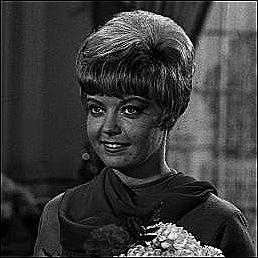

In [12]:
cv2_imshow(convolution2d(img_gray, kernel_sharpen,1,2))

###3. Buat Image Filter untuk Average filter, low pass filter, high pass filter, dan beberapa filter berikut:

###Sharpen

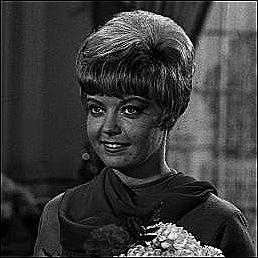

In [17]:
kernel_sharpen = np.array([[0,-1,0],
                           [-1,5,-1],
                           [0,-1,0]])
cv2_imshow(convolution2d(img_gray, kernel_sharpen, 1, 2))

###Emboss

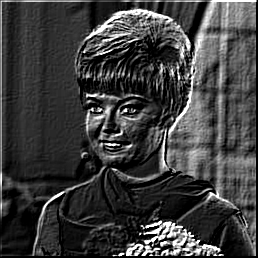

In [14]:
kernel_emboss = np.array([[-2,-1,0],
                           [-1,1,1],
                           [0,1,2]])
cv2_imshow(convolution2d(img_gray, kernel_emboss,1,2))

###Left Sobel Edge Detection

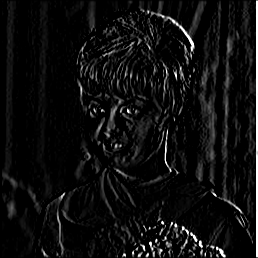

In [15]:
kernel_sobel = np.array([[1,0,-1],
                           [2,0,-2],
                           [1,0,-1]])
cv2_imshow(convolution2d(img_gray, kernel_sobel,1,2))

###Canny Edge Detection

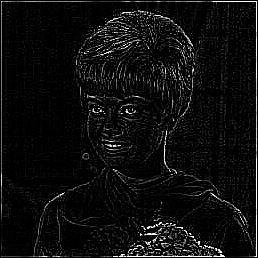

In [16]:
kernel_canny = np.array([[-1,-1,-1],
                           [-1,8,-1],
                           [-1,-1,-1]])
cv2_imshow(convolution2d(img_gray, kernel_canny,1,2))

###Prewit Edge Detection

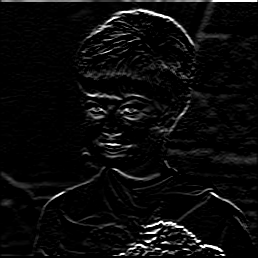

In [18]:
kernel_prewitt = np.array([[-1,-1,-1],
                           [0,0,0],
                           [1,1,1]])
cv2_imshow(convolution2d(img_gray, kernel_prewitt,1,2))

###5x5 Gaussian Blur

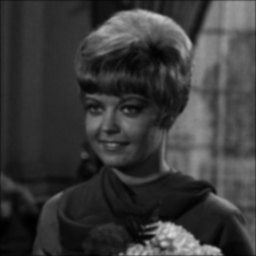

In [20]:
kernel_blur5 = np.array([[1,4,6,4,1],
                              [4,16,24,16,4],
                              [6,24,36,24,6],
                              [4,16,24,16,4],
                              [1,4,6,4,1]]) / 256
cv2_imshow(convolution2d(img_gray, kernel_blur5,1,2))

###21x21 Gaussian Blur

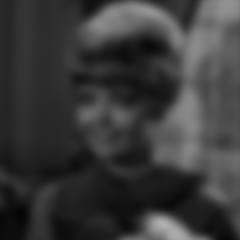

In [21]:
kernel_size = 21
sigma=math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel,1,2))

##Tugas

###KTP

In [22]:
def Brightness (image, brightness):
  brightness_image = np.zeros(image.shape, image.dtype)

  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      for c in range(image.shape[2]):
        brightness_image[y,x,c] = np.clip(image[y,x,c] + brightness, 0, 255)

  return brightness_image

def hist_equ (image):
  channels = cv.split(image)
  eq_channels = []
  for ch, color in zip(channels, ["r", "g", "b"]):
    eq_channels.append(cv.equalizeHist(ch))

  eq_image = cv.merge(eq_channels)

  return eq_image

def adjust_contrast(image, alpha):
  adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=0)
  return adjusted_image

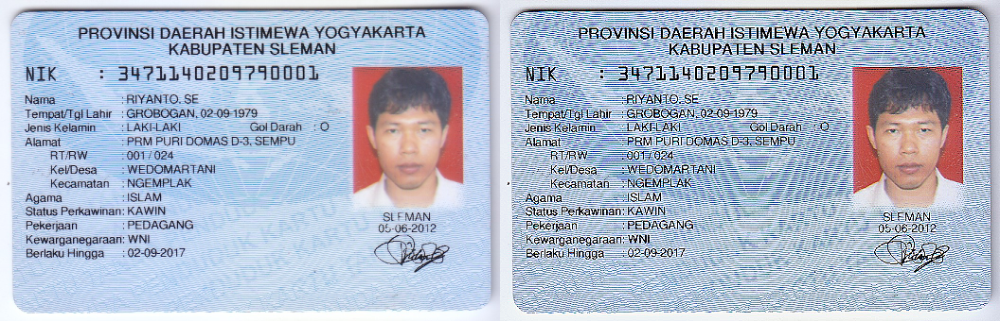

In [25]:
import cv2
ktp = cv.imread('/content/drive/MyDrive/ktp/ktp.jpg')
KTP = cv.resize(ktp, (0,0), fx=0.5, fy=0.5)
brightness = Brightness(KTP, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((KTP, result))
cv2_imshow(final_frame)

###KTP1

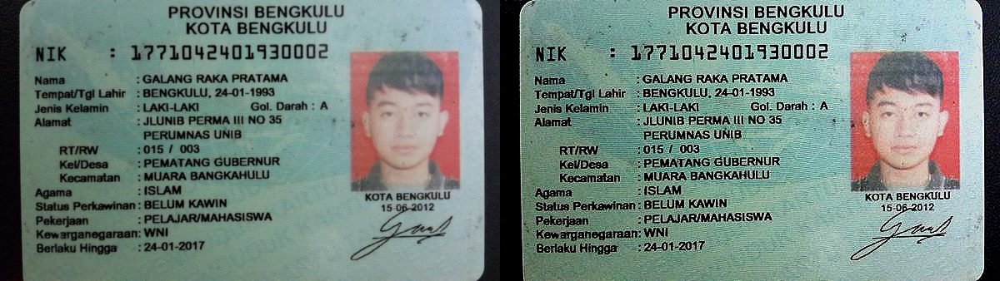

In [26]:
ktp1 = cv.imread('/content/drive/MyDrive/ktp/ktp1.jpg')
contrast = adjust_contrast(ktp1, 1.3)
brightness = Brightness(contrast, -30)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp1, result))
cv2_imshow(final_frame)

###KTP2

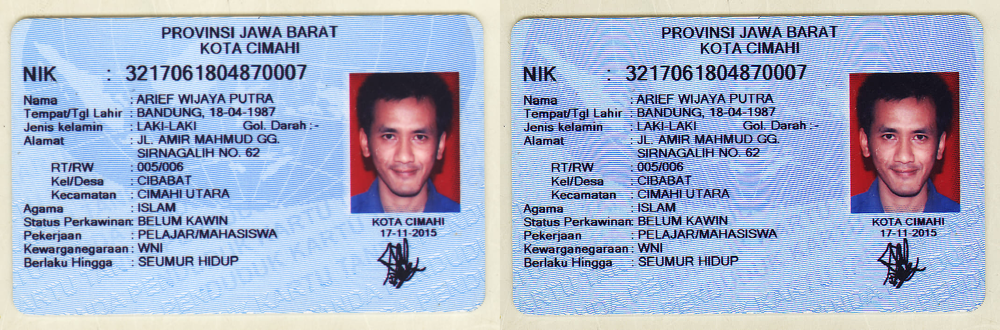

In [34]:
ktp2 = cv.imread('/content/drive/MyDrive/ktp/ktp2.jpg')
brightness = Brightness(ktp2, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp2, result))
cv2_imshow(final_frame)

###KTP3

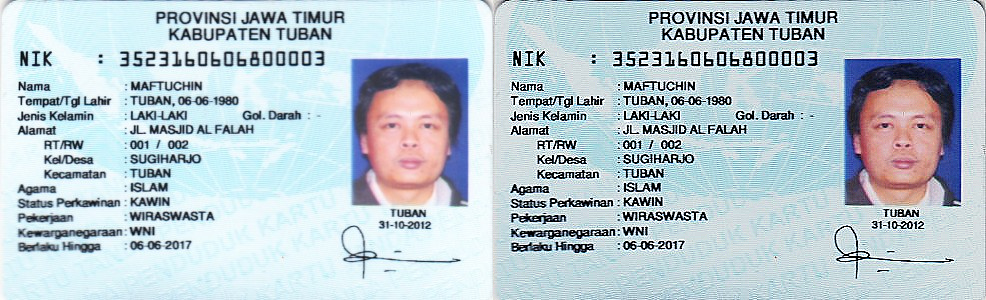

In [29]:
ktp3 = cv.imread('/content/drive/MyDrive/ktp/ktp3.jpg')
brightness = Brightness(ktp3, -30)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp3, result))
cv2_imshow(final_frame)

###KTP4

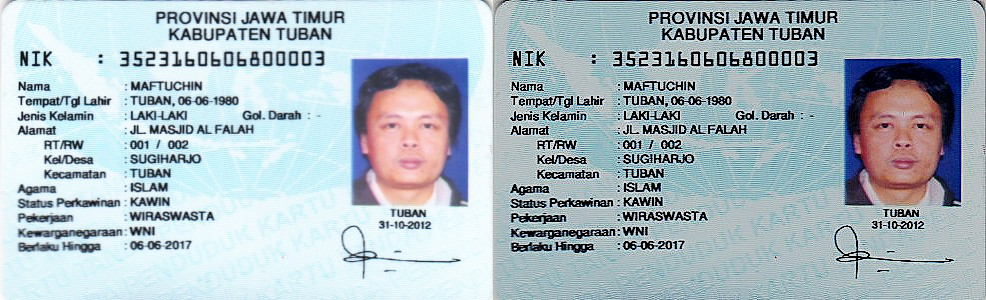

In [31]:
ktp4 = cv.imread('/content/drive/MyDrive/ktp/ktp4.jpg')
contrast = adjust_contrast(ktp4, 1.2)
brightness = Brightness(result, -30)
result = cv2.filter2D(contrast, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp4, brightness))
cv2_imshow(final_frame)

###KTP5

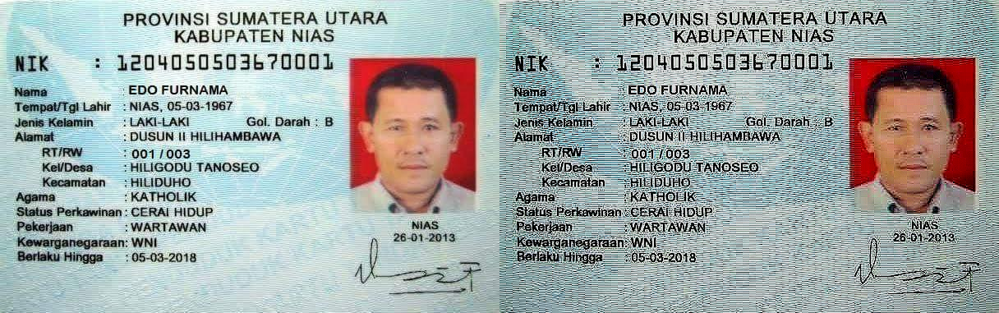

In [30]:
ktp5 = cv.imread('/content/drive/MyDrive/ktp/ktp5.jpg')
conv = cv2.filter2D(ktp5, -1, kernel_sharpen)
brightness = Brightness(conv, -30)
final_frame = cv.hconcat((ktp5, brightness))
cv2_imshow(final_frame)

###KTP6

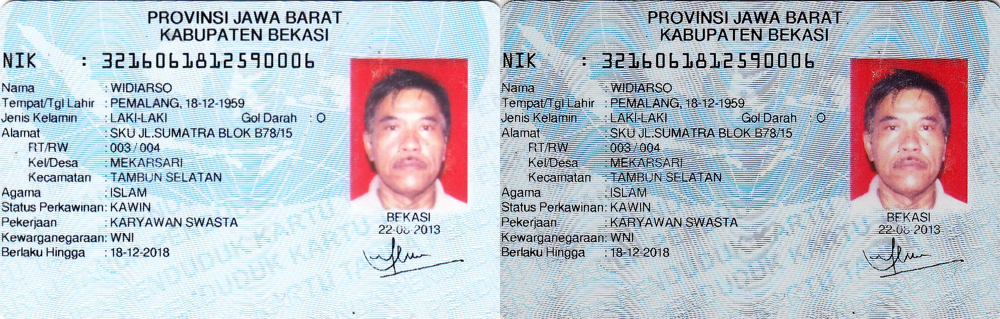

In [32]:
ktp6 = cv.imread('/content/drive/MyDrive/ktp/ktp6.jpg')
conv = cv2.filter2D(ktp6, -1, kernel_sharpen)
brightness = Brightness(conv, -30)
final_frame = cv.hconcat((ktp6, brightness))
cv2_imshow(final_frame)

###KTP7

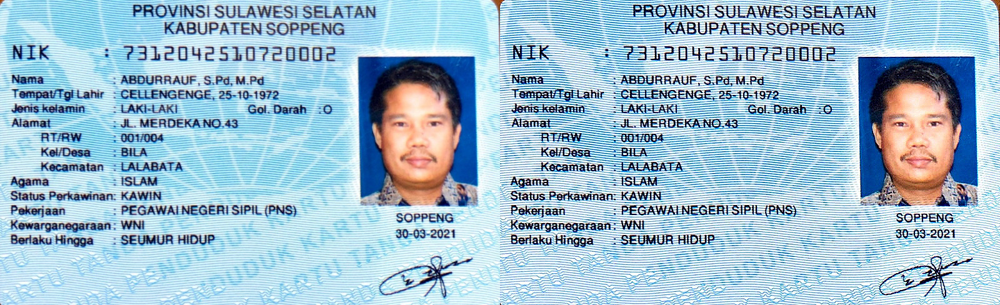

In [33]:
ktp7 = cv.imread('/content/drive/MyDrive/ktp/KTP7.jpeg')
conv = cv2.filter2D(ktp7, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp7, conv))
cv2_imshow(final_frame)